# GroupWork 1

### Generate signal


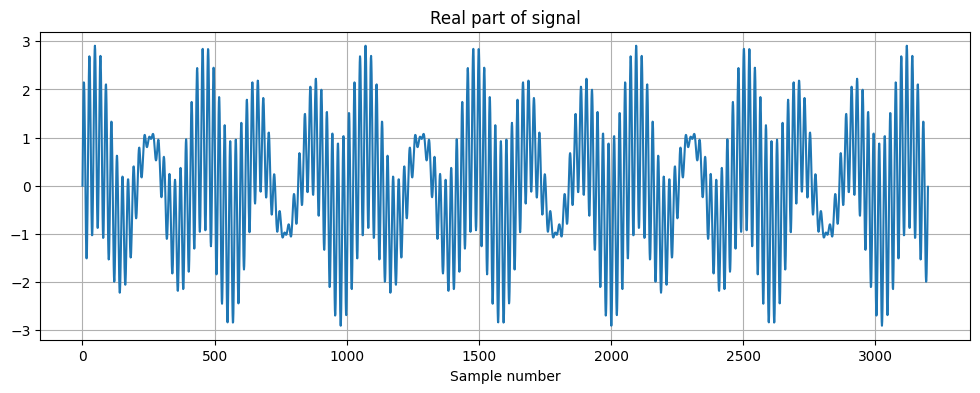

In [14]:
import matplotlib.pyplot as plt
import numpy as np

def generateMultiSinWave(freqs, N=512, sr=1024):
    """Generate a sum of multiple sine waves."""
    time_vector = np.arange(N) / sr
    combined_signal = np.zeros(N)  # Real signal
    
    for freq in freqs:
        combined_signal += np.sin(2 * np.pi * freq * time_vector)
    
    return combined_signal

def plotSignal(signal):
    
    plt.figure(figsize=(12, 4))
    plt.plot(np.real(signal))
    plt.title('Real part of signal')
    plt.xlabel('Sample number')
    plt.grid()
    plt.show()

freqs = [5, 48, 50]
sr = 1024
N = 3200

signal = generateMultiSinWave(freqs, N, sr)

plotSignal(signal)

### Non-stationary or stationary

The signal is clealry stationary as can be observered, where it has a repeating, constant pattern.

### Fast Fourier Transform

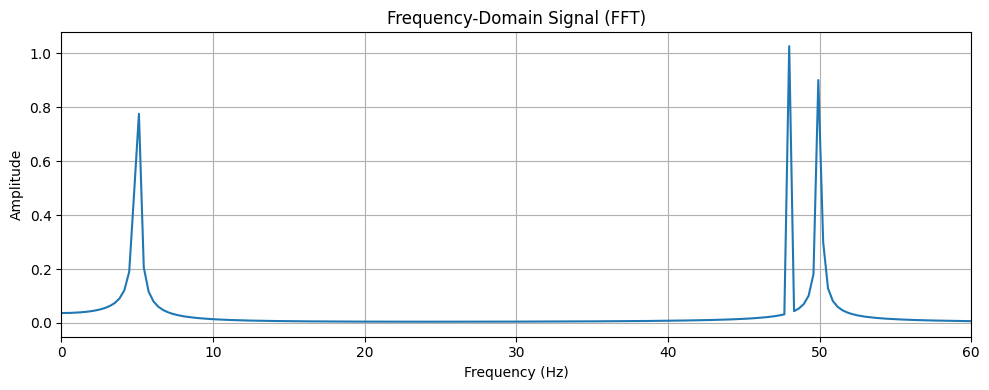

In [15]:
from scipy.fft import fft, fftfreq

def FFT(signal, N = 512, sr = 1024):
    yF = fft(signal)
    xF = fftfreq(N, 1/sr) [:N // 2]
    return xF, yF

def plotFFT(xFFT, yFFT):

    # Plot the original signal
    plt.figure(figsize=(10, 4))
    plt.plot(xFFT, 2.0 * np.abs(yFFT[0:N // 2]) / N)
    plt.title("Frequency-Domain Signal (FFT)")
    plt.xlabel("Frequency (Hz)")
    plt.ylabel("Amplitude")
    plt.xlim(0, 60)
    plt.grid()
    plt.tight_layout()
    plt.show()

freqs = [5, 48, 50]
sr = 1024
N = 3200

signal = generateMultiSinWave(freqs, N, sr)

xFFT, yFFT = FFT(signal, N, sr)
plotFFT(xFFT, yFFT)

Can clearly see the signal consists of 3 differenet frequencies, 5hz, 48hz and 50hz. The reason the amplitudes isnt always 1 is due to bin size which leads to spectral leakage. 

### Window size in STFT or WT

For STFT we already know that/ strongly suspect that the signal is stationary. Therefor we do not care about time resolution and simple want to achievie the best possible frequency resolution. This means we will use very big windows. For WT we know from the FFT analysis that there are 5,48,50 hz components and we choose the scales correspsondingly. 

### Short-Time Fourier Transform

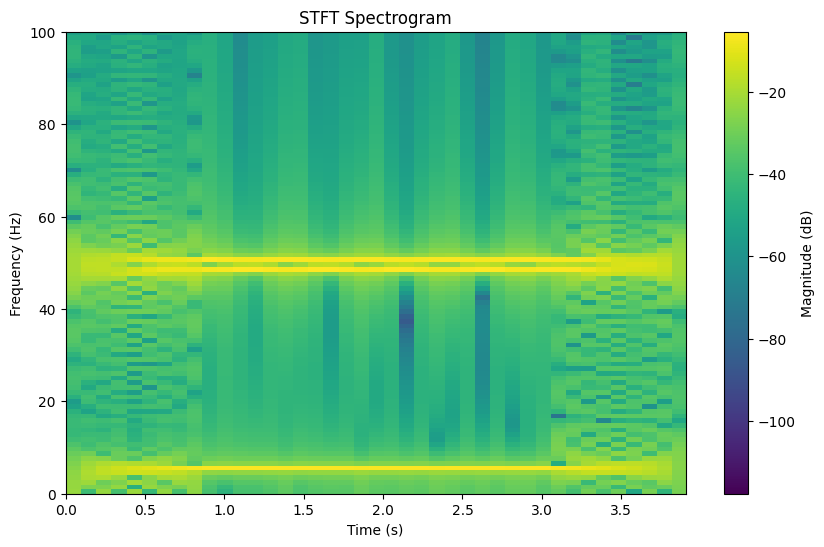

In [16]:
from scipy.signal import ShortTimeFFT
from scipy.signal.windows import gaussian, boxcar
import numpy as np
import matplotlib.pyplot as plt

def STFT(signal, sr=1024, window_length=500, g_std=8, hop_length=10):
    #w = gaussian(window_length, std=g_std, sym=True)
    w = boxcar(window_length) #Gives the best freq resolution
    SFT = ShortTimeFFT(w, hop=hop_length, fs=sr, mfft=window_length, scale_to='magnitude')
    return SFT.stft(signal)

def plotSTFT(stft_result, sr, max_freq=100, hop_length=10):
    n_freq_bins, n_time_bins = stft_result.shape
    
    freq_axis = np.linspace(0, sr/2, n_freq_bins)
    time_axis = np.arange(n_time_bins) * hop_length / sr 
    
    plt.figure(figsize=(10, 6))
    magnitude_db = 20 * np.log10(np.abs(stft_result) + 1e-10)
    
    plt.imshow(magnitude_db, aspect='auto', origin='lower',
               extent=[time_axis[0], time_axis[-1], freq_axis[0], freq_axis[-1]])
    plt.colorbar(label='Magnitude (dB)')
    plt.title('STFT Spectrogram')
    plt.xlabel('Time (s)')
    plt.ylabel('Frequency (Hz)')
    plt.ylim(0, max_freq)
    plt.show()

freqs = [5, 48, 50]
sr = 1024
N = 3200

signal = generateMultiSinWave(freqs, N, sr)

window_length = 1000
hop_length = 100
g_std = 1

xStft = STFT(signal, sr=sr, window_length=window_length, g_std=g_std, hop_length=hop_length)

plotSTFT(xStft, sr, max_freq=100, hop_length=hop_length)

### Wigner-Ville Transform

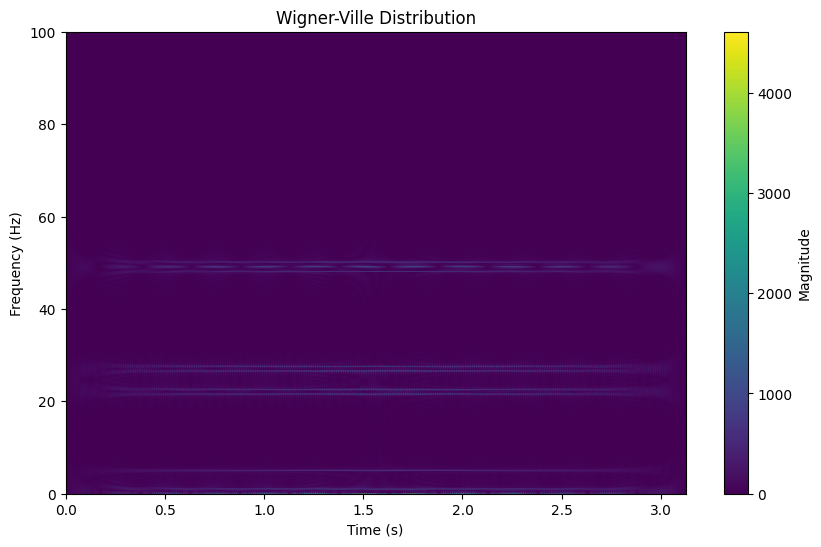

In [17]:
from tftb.processing import WignerVilleDistribution
import numpy as np
import matplotlib.pyplot as plt

def WVT(signal):
    """Wigner-Ville using TFTB"""
    wvd = WignerVilleDistribution(signal)
    wvd_result, _, _ = wvd.run()
    return wvd_result

def plotWVD(wvd_matrix):
    plt.figure(figsize=(10, 6))
    plt.imshow(np.abs(wvd_matrix), aspect='auto', origin='lower', 
            extent=[0, len(signal)/sr, 0, sr/2])
    plt.colorbar(label='Magnitude')
    plt.title('Wigner-Ville Distribution')
    plt.xlabel('Time (s)')
    plt.ylabel('Frequency (Hz)')
    plt.ylim(0, 100)
    plt.show()

freqs = [5, 48, 50]
sr = 1024
N = 3200

signal = generateMultiSinWave(freqs, N, sr)

wvd_matrix = WVT(signal)
plotWVD(wvd_matrix)

### Wavelet Transform

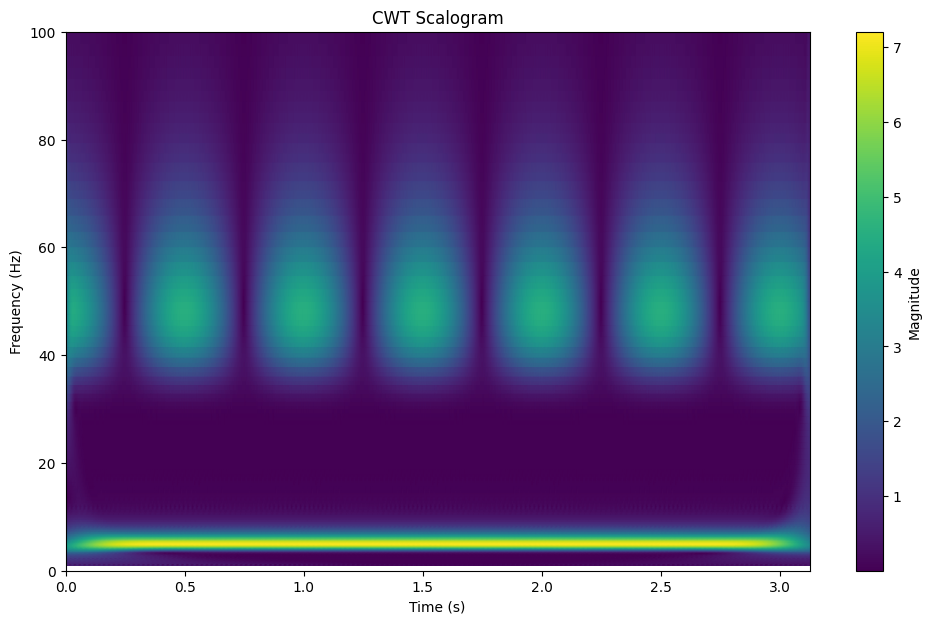

In [18]:
import pywt

def create_logarithmic_scales(min_freq, max_freq, num_scales, sr, wavelet='cmor1.5-1.0'):

    frequencies = np.logspace(np.log10(min_freq), np.log10(max_freq), num_scales)

    central_freq = pywt.central_frequency(wavelet)
    
    scales = central_freq * sr / frequencies
    
    # Return in ascending order of frequency (descending order of scale)
    return scales[::-1]

def CWT(signal, sr, min_freq=1, max_freq=100, num_scales=200, wavelet = 'cmor1.5-1.0'):
    """
    Performs a robust CWT analysis using logarithmically spaced scales.
    """

    scales = create_logarithmic_scales(min_freq, max_freq, num_scales, sr, wavelet)
    
    coefficients, frequencies = pywt.cwt(signal, scales, wavelet, 1.0 / sr)
    
    return coefficients, frequencies

def plot_cwt(coefficients, frequencies, signal, sr, max_freq=100):
   time_axis = np.arange(len(signal)) / sr
   
   plt.figure(figsize=(12, 7))
   plt.pcolormesh(time_axis, frequencies, np.abs(coefficients), shading='gouraud')
   
   plt.colorbar(label='Magnitude')
   plt.title('CWT Scalogram')
   plt.xlabel('Time (s)')
   plt.ylabel('Frequency (Hz)')
   # Set sensible limits, e.g., from the min frequency used to half the sampling rate.
   plt.ylim(0, max_freq)
   plt.show()

   
freqs = [5, 48, 50]
sr = 1024
N = 3200

signal = generateMultiSinWave(freqs, N, sr)

coefficients, frequencies = CWT(signal, sr=sr, min_freq=1, max_freq=100, num_scales=100, wavelet='cmor1.0-1.0')
plot_cwt(coefficients, frequencies, signal, sr)

### Hilbert Transform

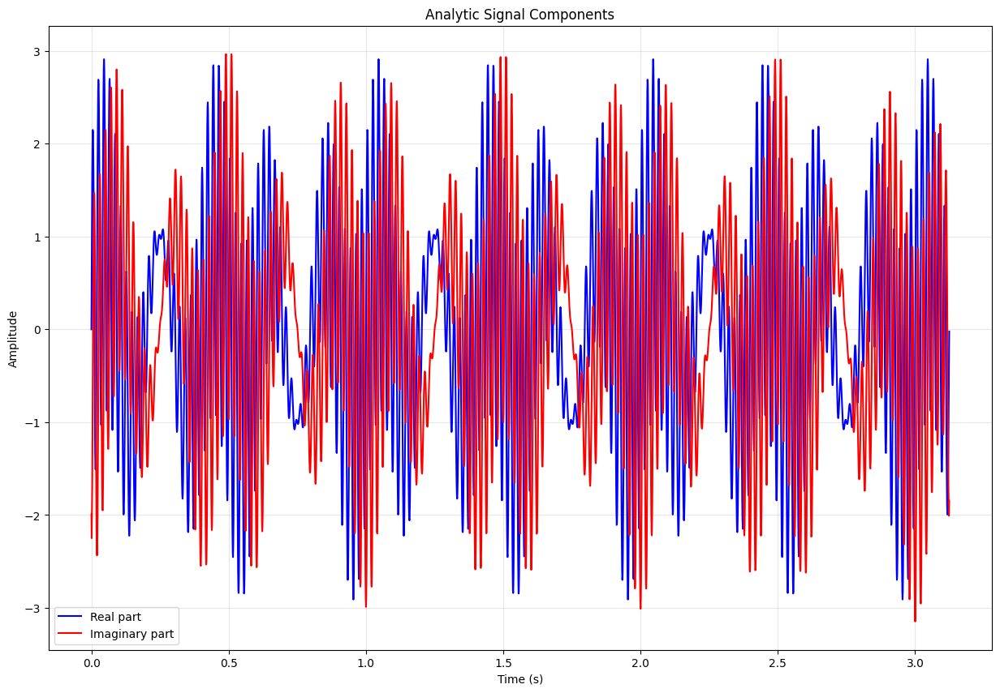

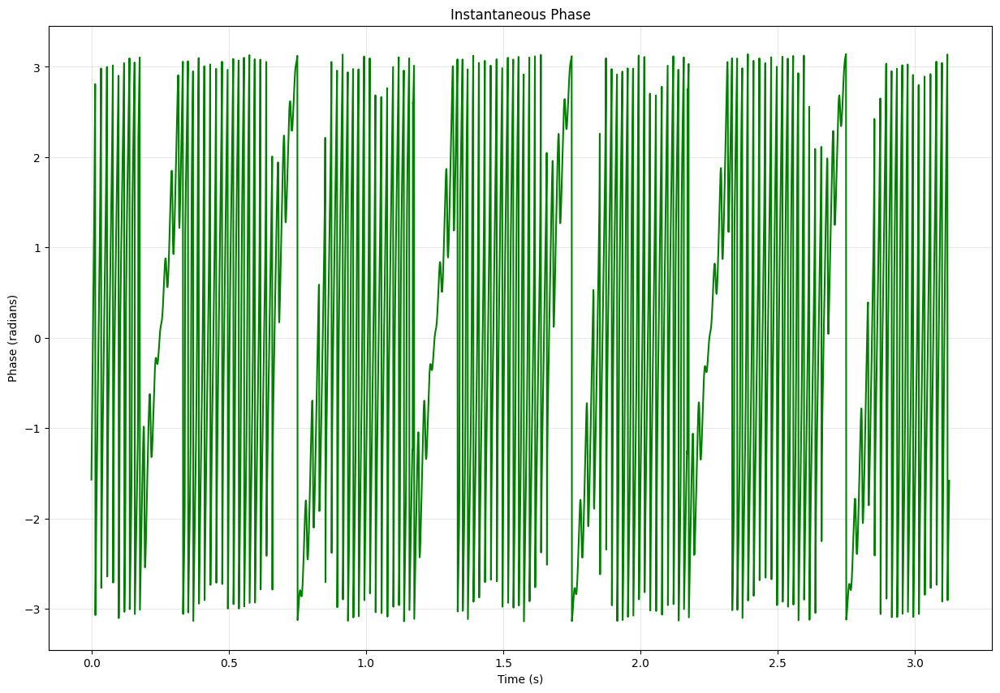

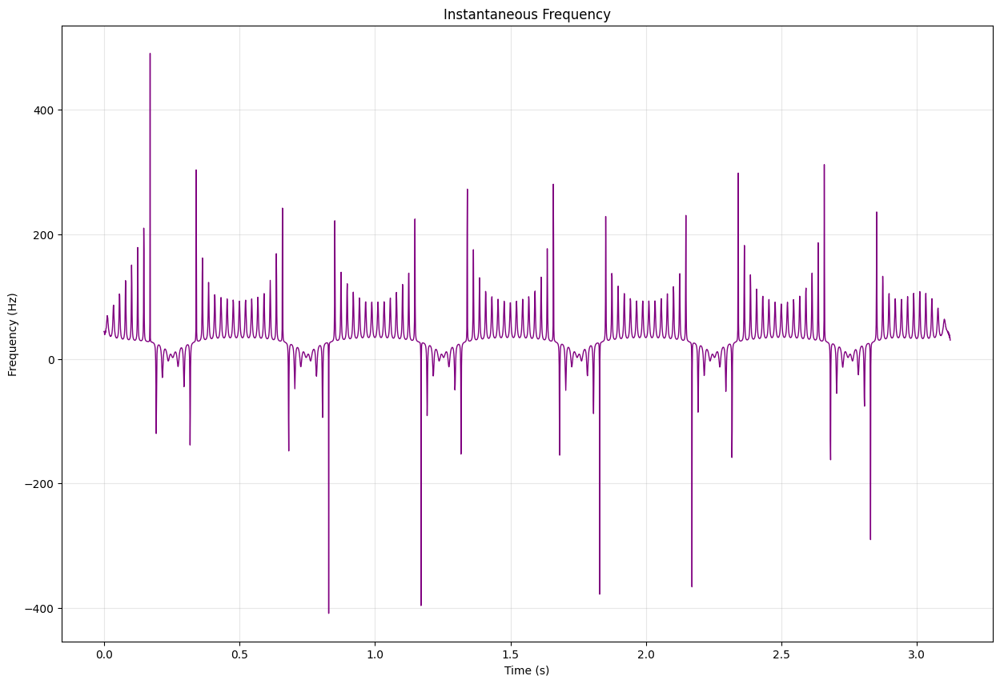

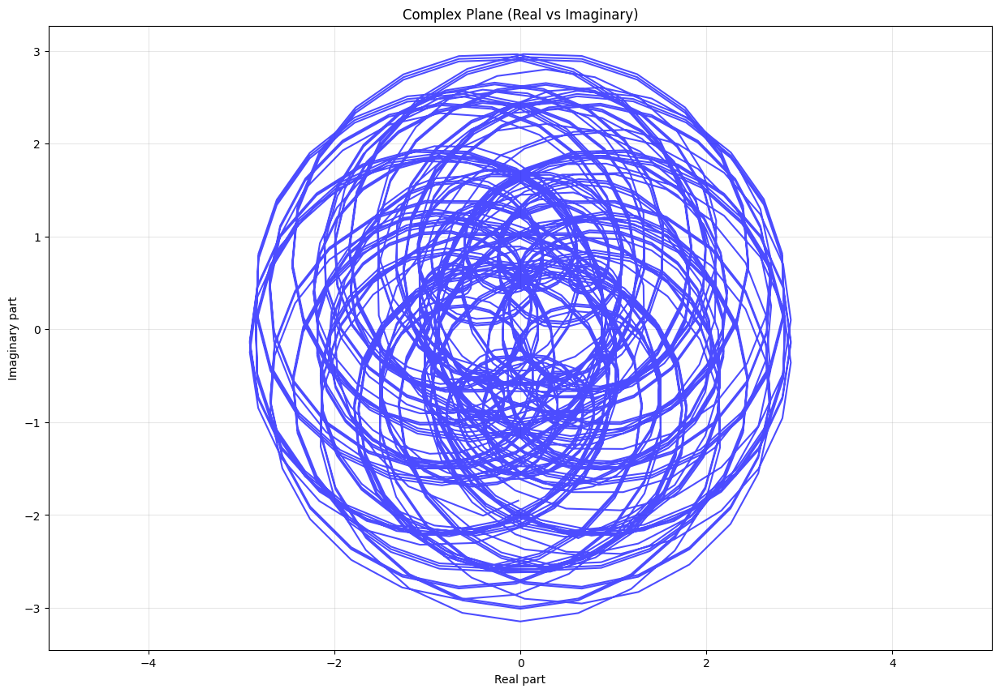

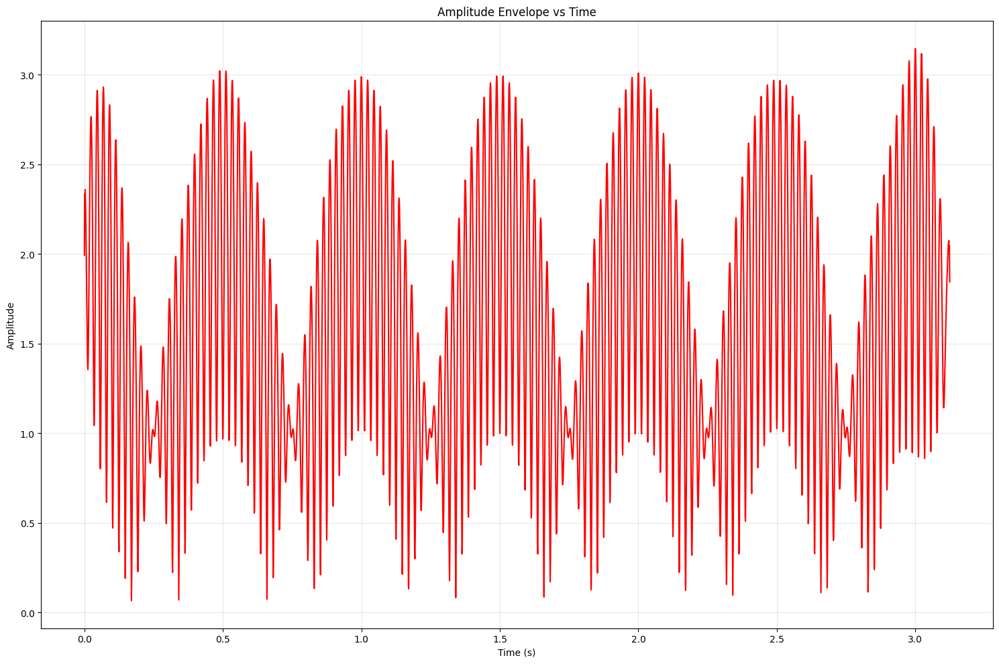

In [19]:
from scipy.signal import hilbert
import numpy as np
import matplotlib.pyplot as plt

def hilbert_analysis(signal, sr=1000):
    """Perform Hilbert Transform analysis"""
    
    analytic_signal = hilbert(signal)
    
    amplitude_envelope = np.abs(analytic_signal)
    instantaneous_phase = np.angle(analytic_signal)
    instantaneous_frequency = np.diff(np.unwrap(instantaneous_phase)) * sr / (2 * np.pi)
    
    return analytic_signal, amplitude_envelope, instantaneous_phase, instantaneous_frequency

def plot_hilbert_analysis(analytic_signal, amplitude, phase, inst_freq, sr=1000):
    time_axis = np.arange(len(signal)) / sr
    
    # 1. Real and Imaginary parts
    plt.figure(figsize=(15, 10))
    plt.plot(time_axis, np.real(analytic_signal), 'b-', label='Real part')
    plt.plot(time_axis, np.imag(analytic_signal), 'r-', label='Imaginary part')
    plt.title('Analytic Signal Components')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # 2. Instantaneous Phase
    plt.figure(figsize=(15, 10))
    plt.plot(time_axis, phase, 'g-')
    plt.title('Instantaneous Phase')
    plt.xlabel('Time (s)')
    plt.ylabel('Phase (radians)')
    plt.grid(True, alpha=0.3)
    
    # 3. Instantaneous Frequency
    plt.figure(figsize=(15, 10))
    plt.plot(time_axis[:-1], inst_freq, 'purple', linewidth=1)
    plt.title('Instantaneous Frequency')
    plt.xlabel('Time (s)')
    plt.ylabel('Frequency (Hz)')
    plt.grid(True, alpha=0.3)
    
    # 4. Complex plane representation
    plt.figure(figsize=(15, 10))
    plt.plot(np.real(analytic_signal), np.imag(analytic_signal), 'b-', alpha=0.7)
    plt.title('Complex Plane (Real vs Imaginary)')
    plt.xlabel('Real part')
    plt.ylabel('Imaginary part')
    plt.grid(True, alpha=0.3)
    plt.axis('equal')
    
    # 5. Spectrogram of instantaneous frequency
    plt.figure(figsize=(15, 10))
    plt.plot(time_axis, amplitude, 'r-')
    plt.title('Amplitude Envelope vs Time')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

freqs = [5, 48, 50]
sr = 1024
N = 3200

signal = generateMultiSinWave(freqs, N, sr)

analytic_signal, amplitude, phase, inst_freq = hilbert_analysis(signal, sr)
plot_hilbert_analysis(analytic_signal, amplitude, phase, inst_freq, sr)

## With Offset

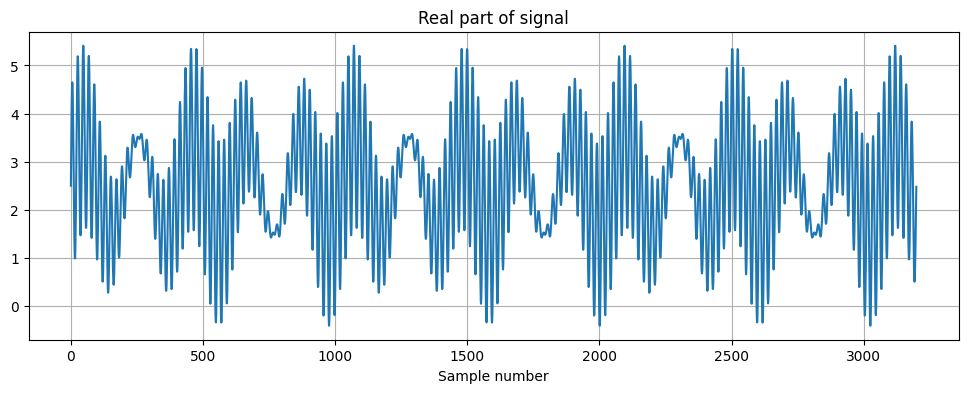

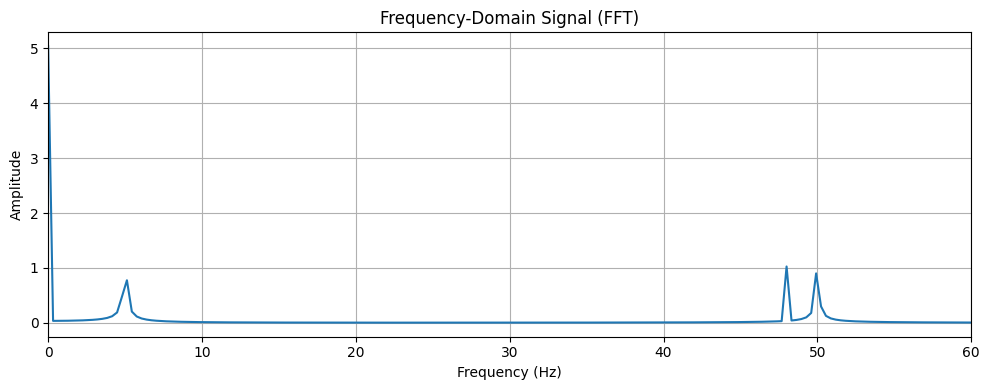

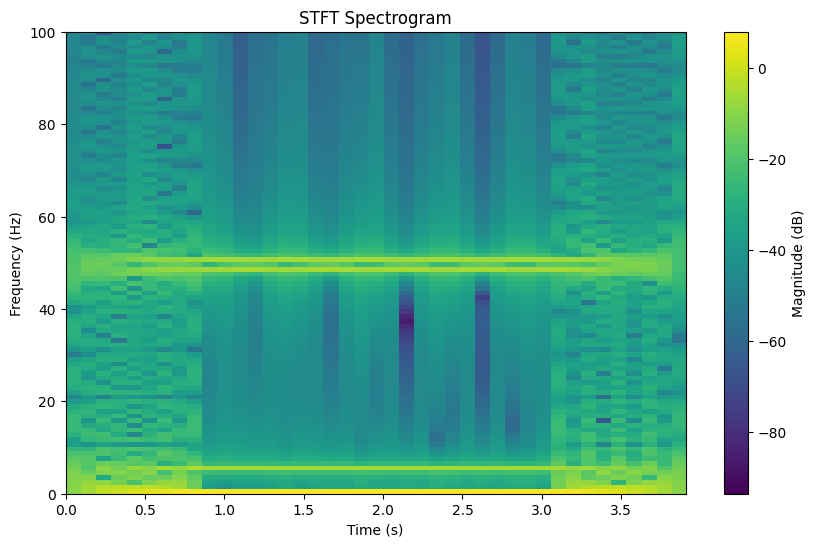

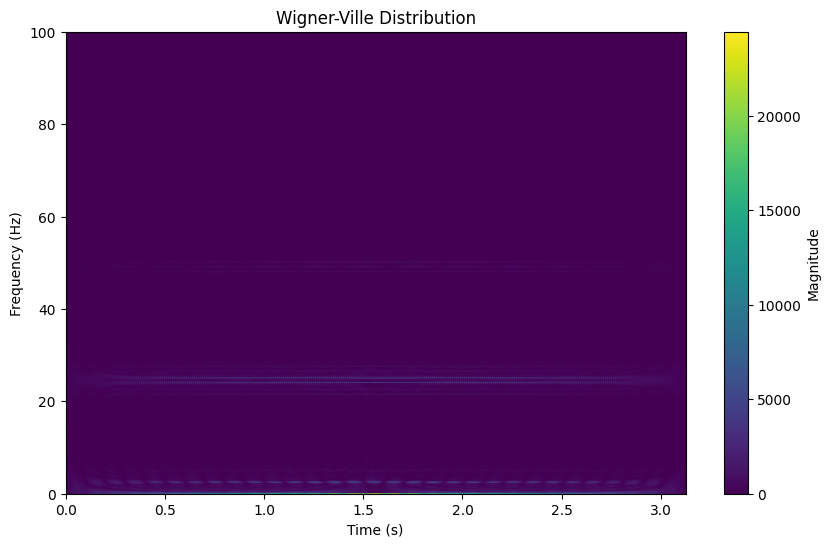

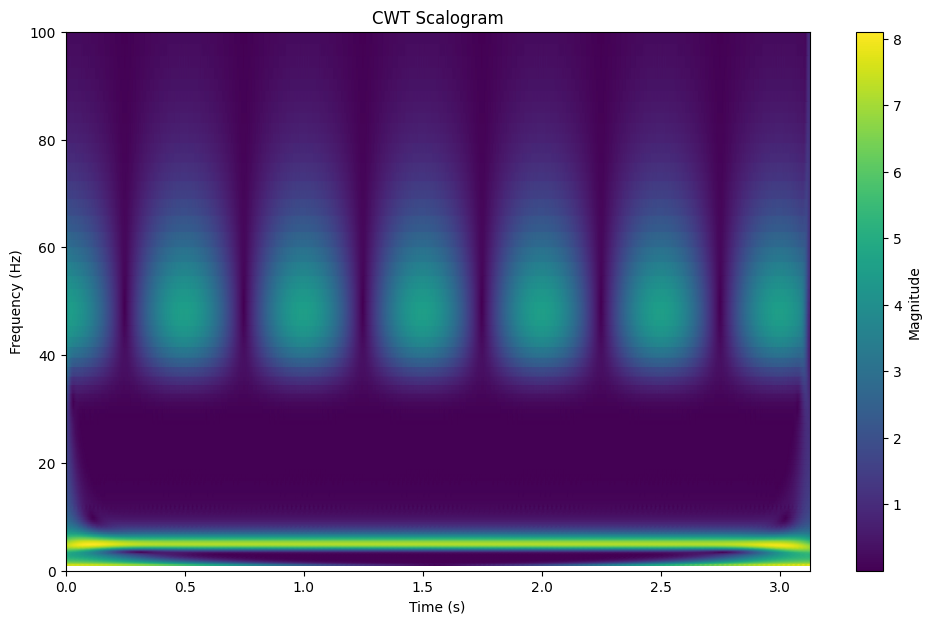

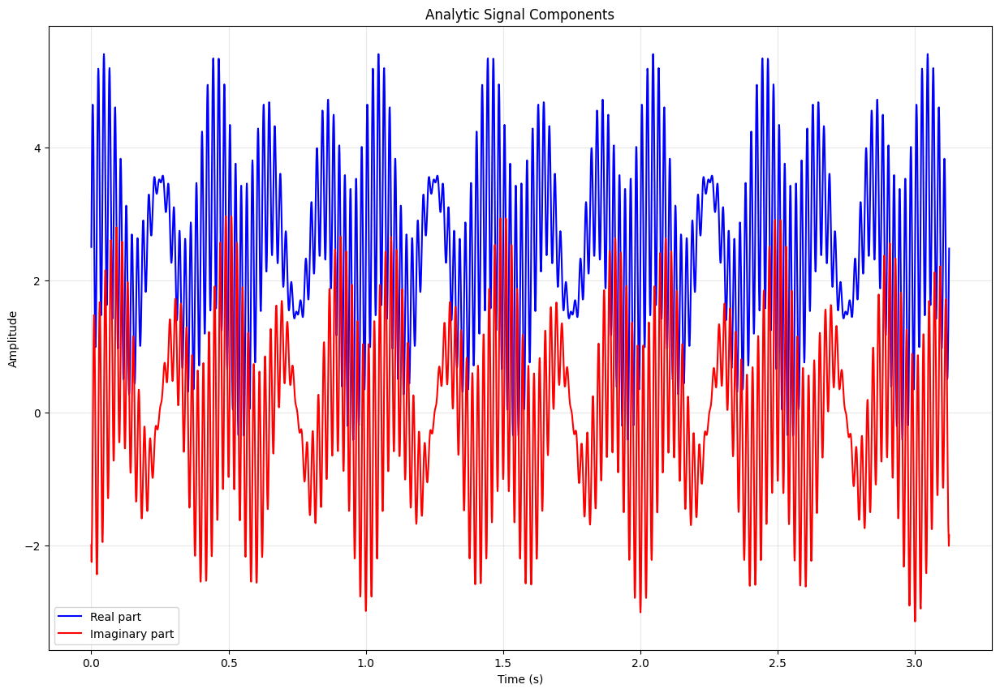

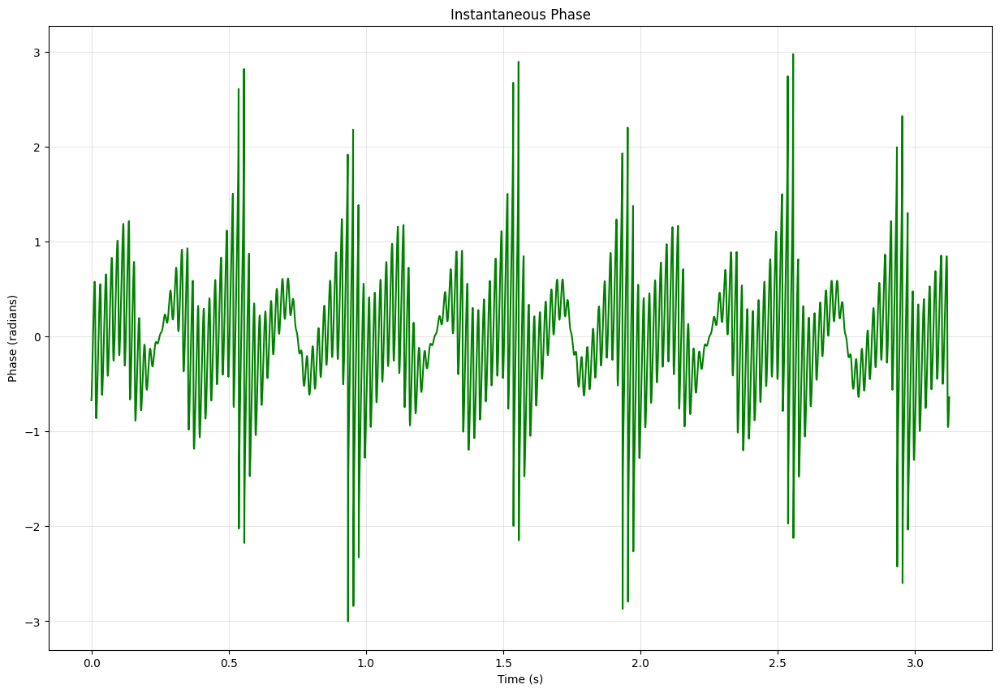

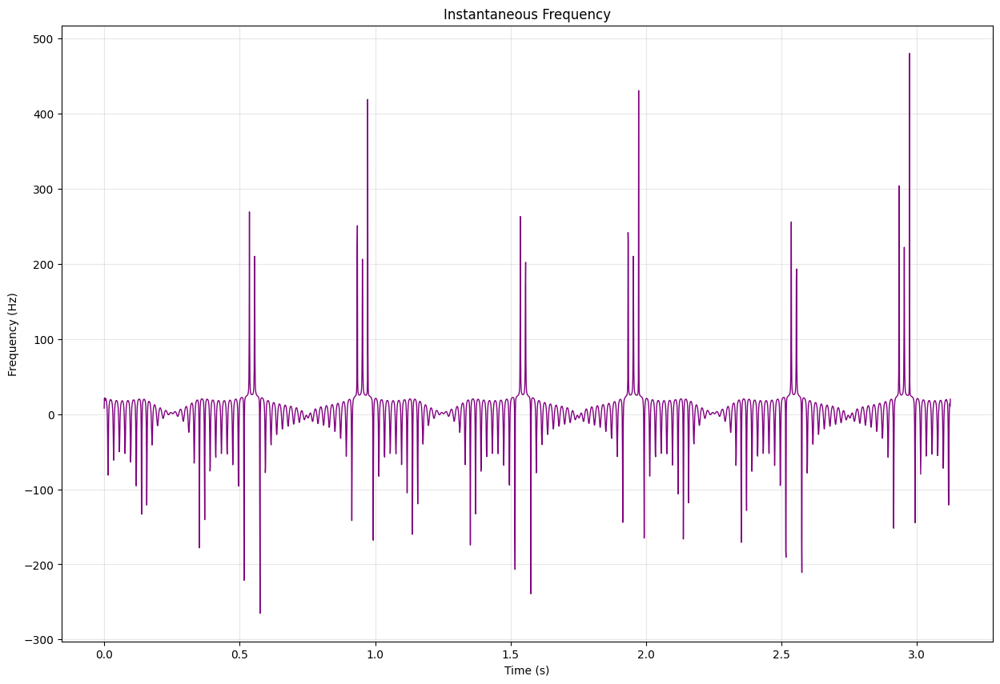

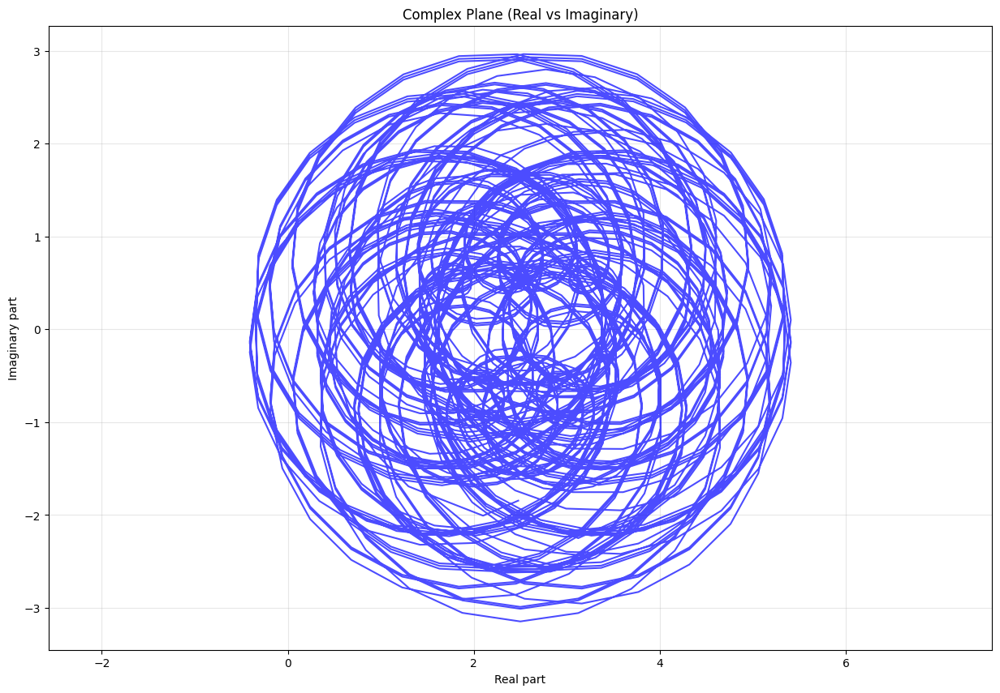

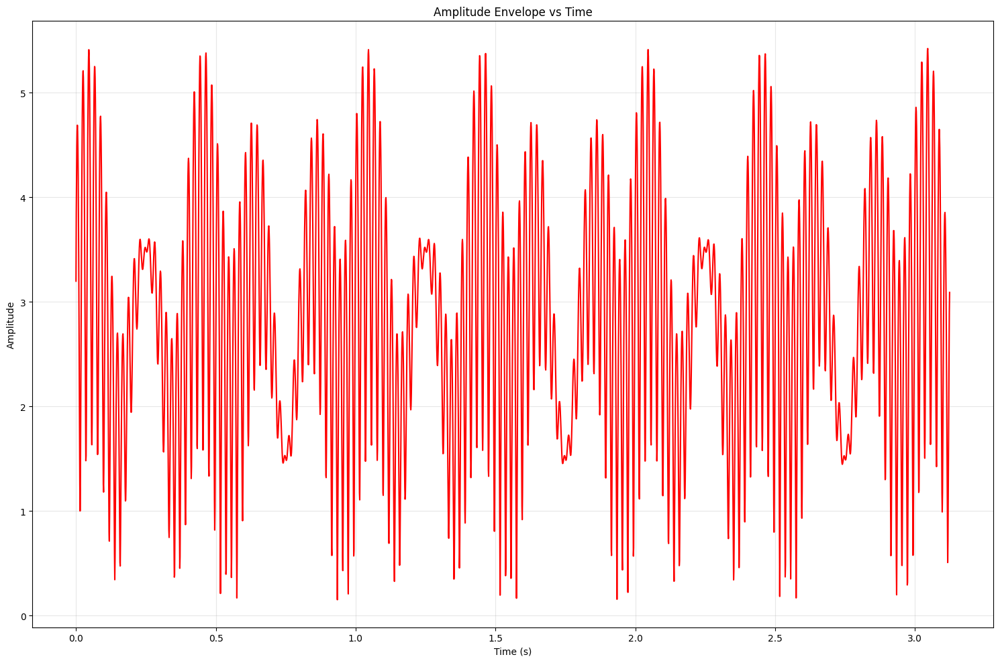

In [20]:
freqs = [5, 48, 50]
sr = 1024
N = 3200
offset = 2.5

signal = generateMultiSinWave(freqs, N, sr)
signal_with_offset = signal + offset
plotSignal(signal_with_offset)

xFFT, yFFT = FFT(signal_with_offset, N, sr)
plotFFT(xFFT, yFFT)

xSTFT = STFT(signal_with_offset, sr=sr, window_length=window_length, g_std=g_std, hop_length=hop_length)
plotSTFT(xSTFT, sr, max_freq=100, hop_length=hop_length)

wvd_matrix = WVT(signal_with_offset)
plotWVD(wvd_matrix)

coefficients, frequencies = CWT(signal_with_offset, sr=sr, min_freq=1, max_freq=100, num_scales=100, wavelet='cmor1.0-1.0')
plot_cwt(coefficients, frequencies, signal_with_offset, sr)

analytic_signal, amplitude, phase, inst_freq = hilbert_analysis(signal_with_offset, sr)
plot_hilbert_analysis(analytic_signal, amplitude, phase, inst_freq, sr)

## With White Noise

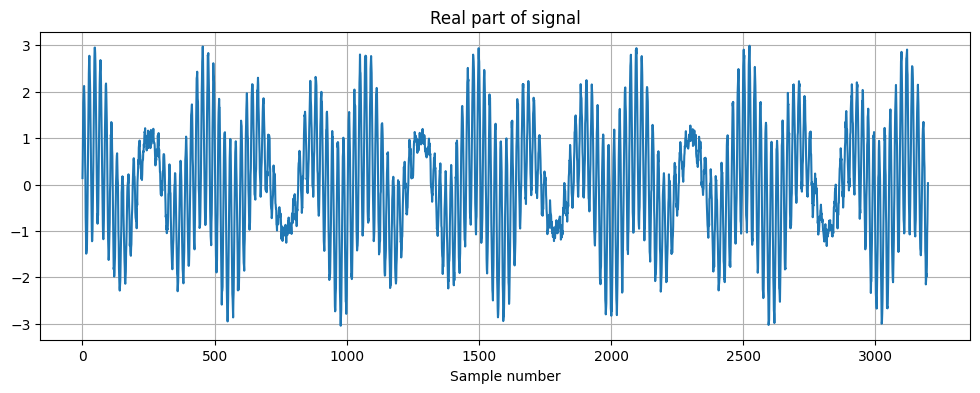

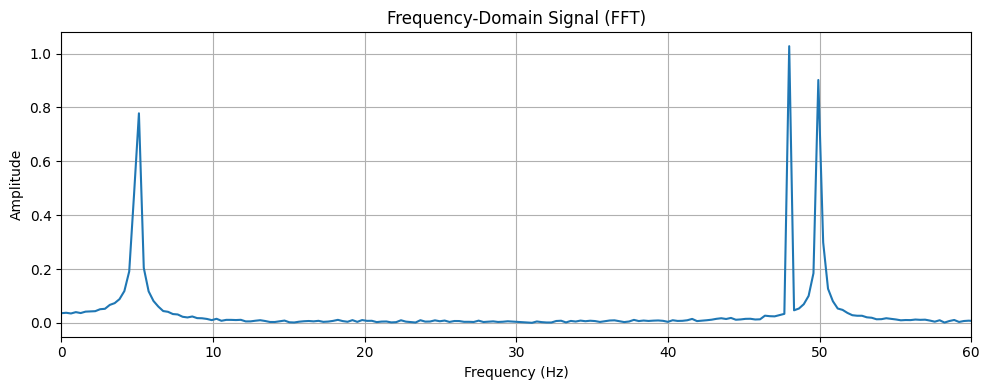

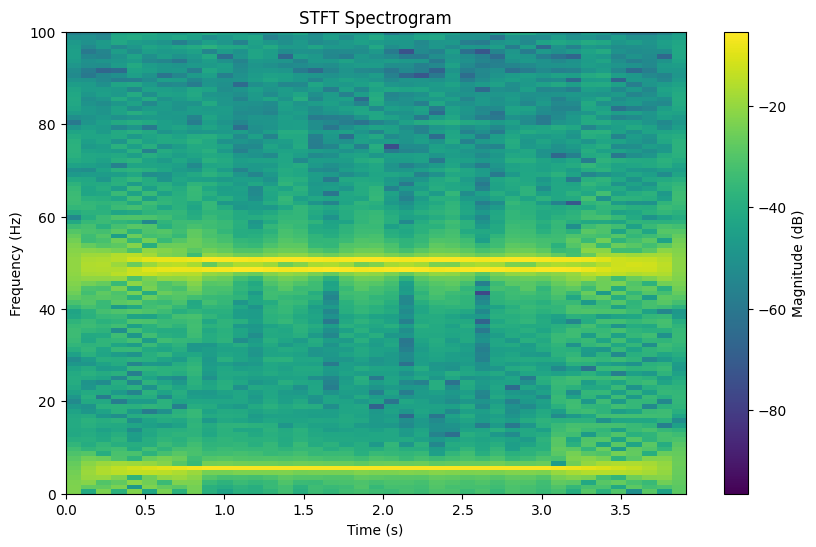

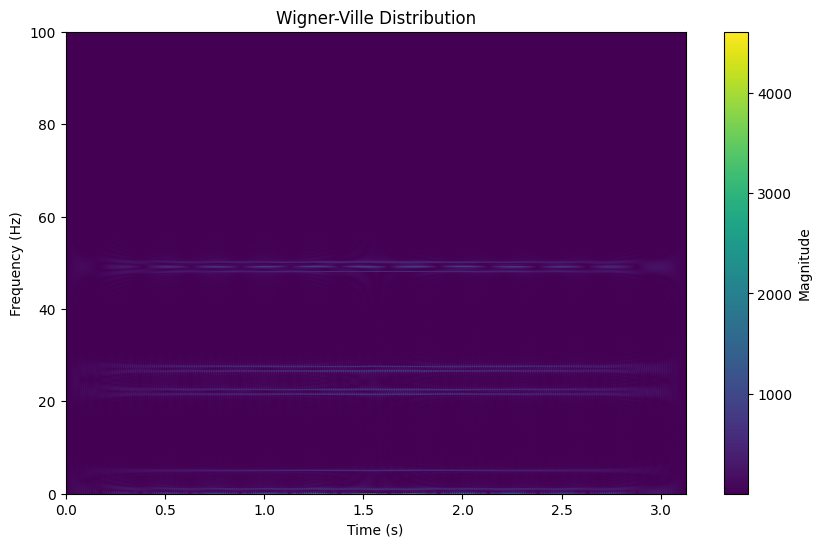

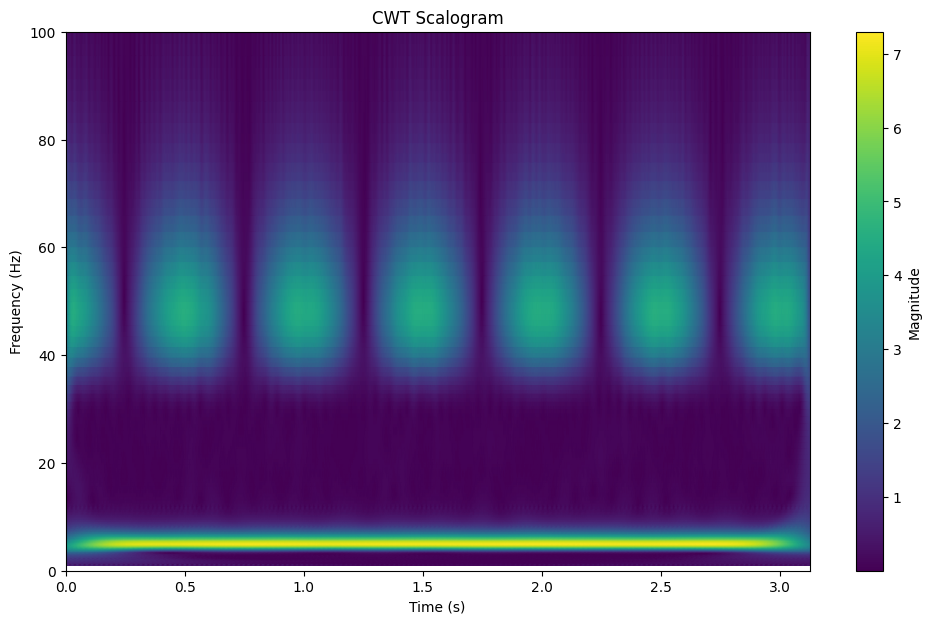

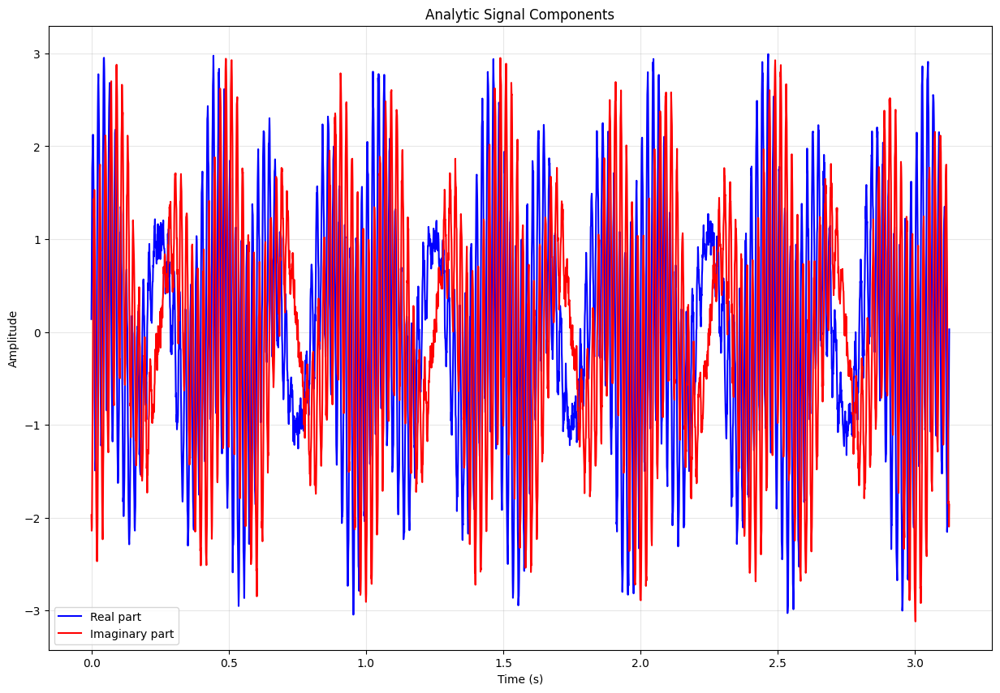

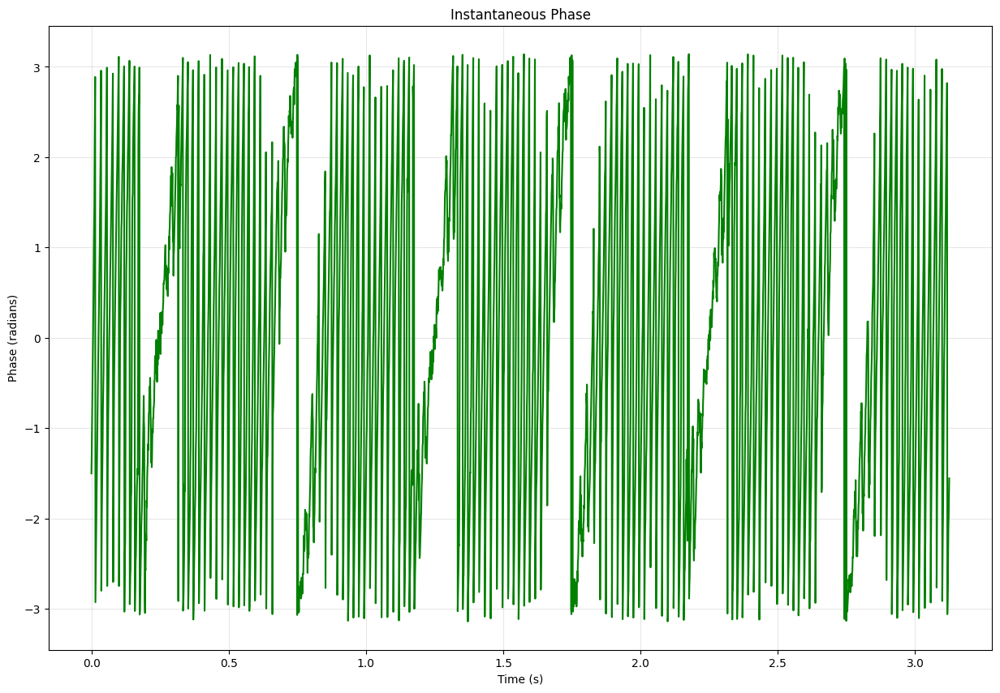

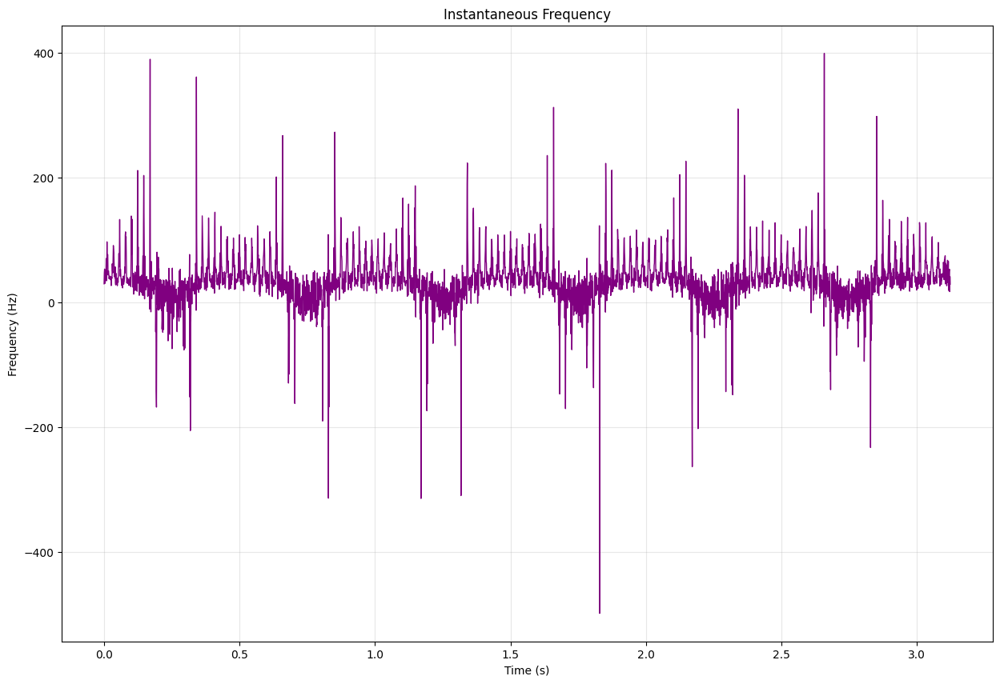

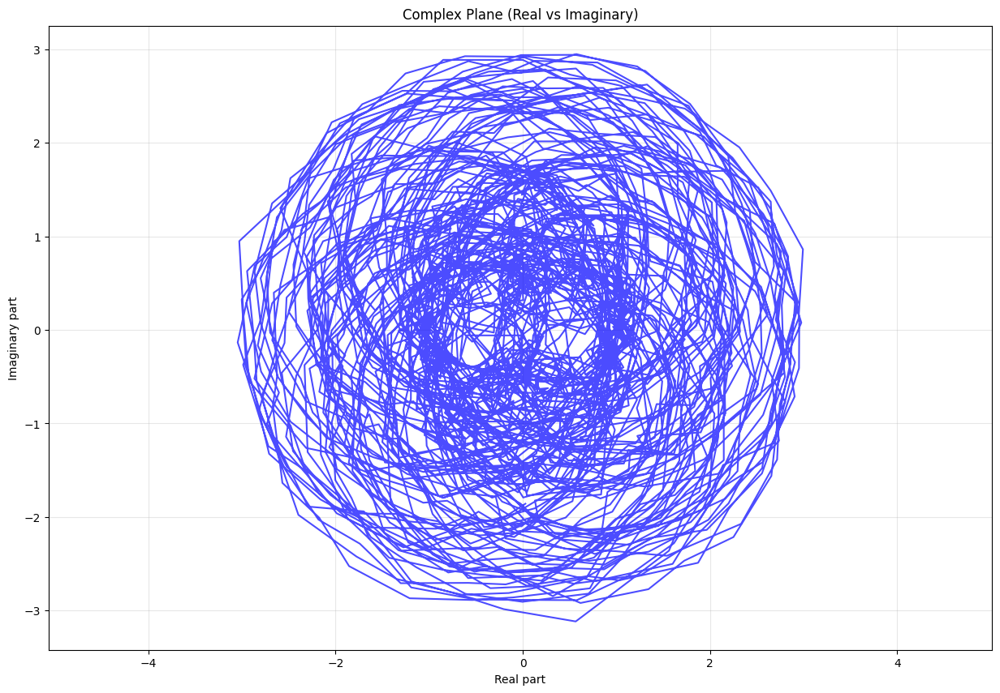

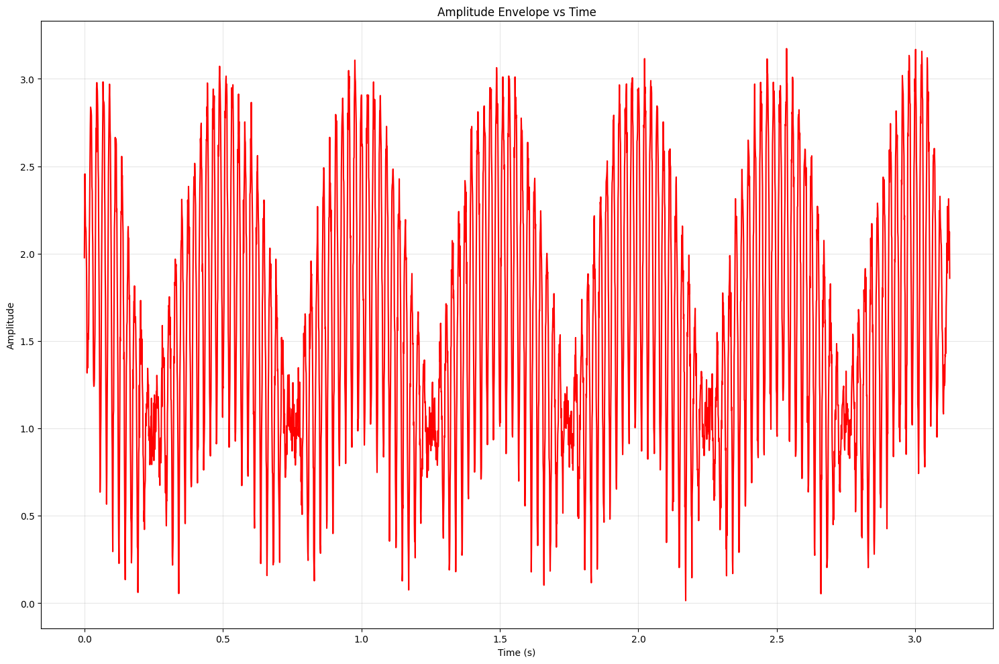

In [21]:
def add_white_noise(signal, noise_level=0.1):
    """Add white Gaussian noise to signal"""
    noise = np.random.normal(0, noise_level, len(signal))
    return signal + noise

freqs = [5, 48, 50]
sr = 1024
N = 3200

signal = generateMultiSinWave(freqs, N, sr)
signal_with_noise = add_white_noise(signal)
plotSignal(signal_with_noise)

xFFT, yFFT = FFT(signal_with_noise, N, sr)
plotFFT(xFFT, yFFT)

xSTFT = STFT(signal_with_noise, sr=sr, window_length=window_length, g_std=g_std, hop_length=hop_length)
plotSTFT(xSTFT, sr, max_freq=100, hop_length=hop_length)

wvd_matrix = WVT(signal_with_noise)
plotWVD(wvd_matrix)

coefficients, frequencies = CWT(signal_with_noise, sr=sr, min_freq=1, max_freq=100, num_scales=100, wavelet='cmor1.0-1.0')
plot_cwt(coefficients, frequencies, signal_with_noise, sr)

analytic_signal, amplitude, phase, inst_freq = hilbert_analysis(signal_with_noise, sr)
plot_hilbert_analysis(analytic_signal, amplitude, phase, inst_freq, sr)

## With A Linearly Time Varying Frequency Component 

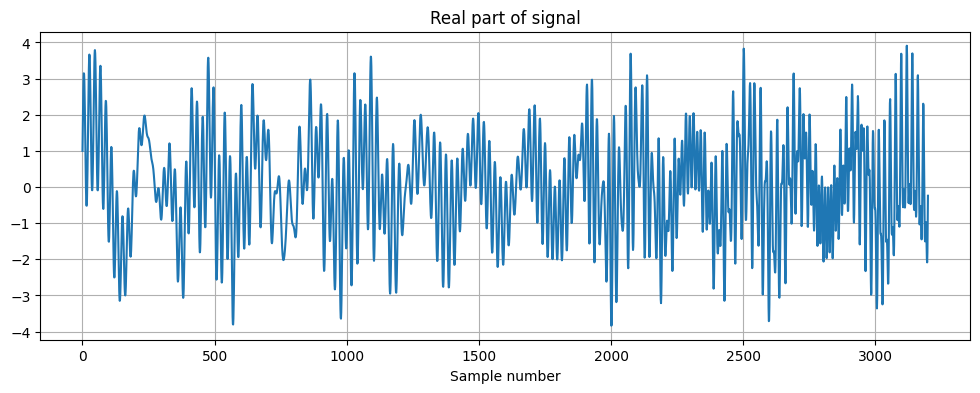

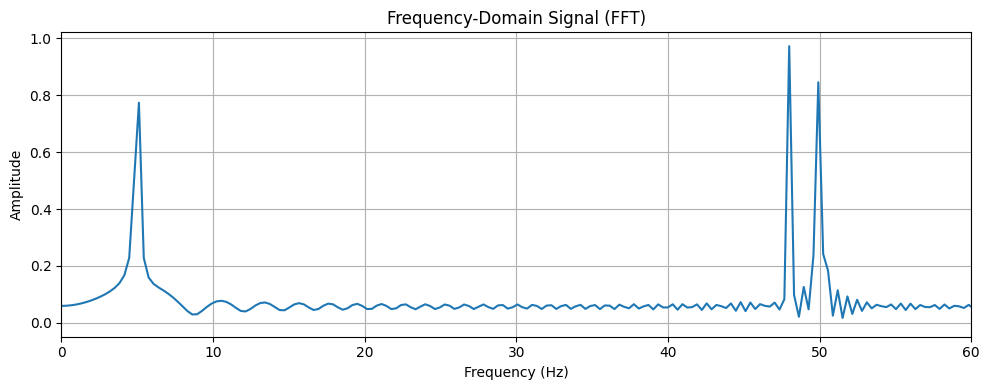

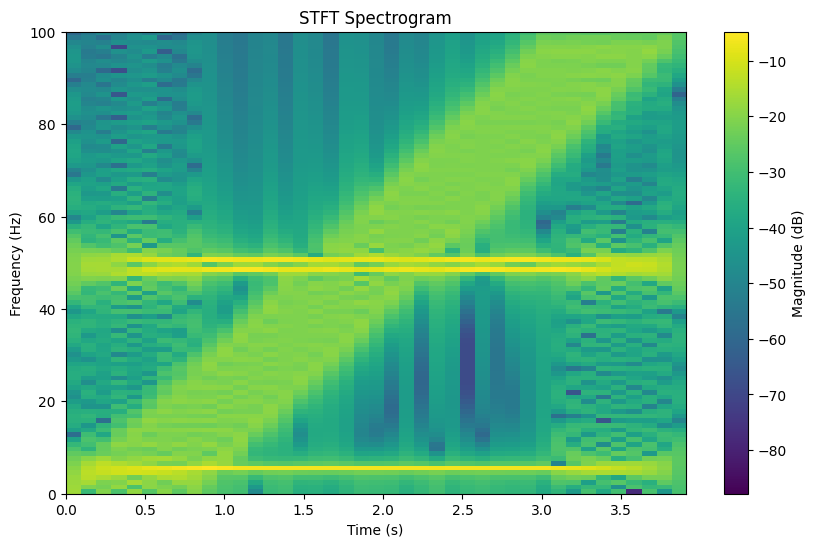

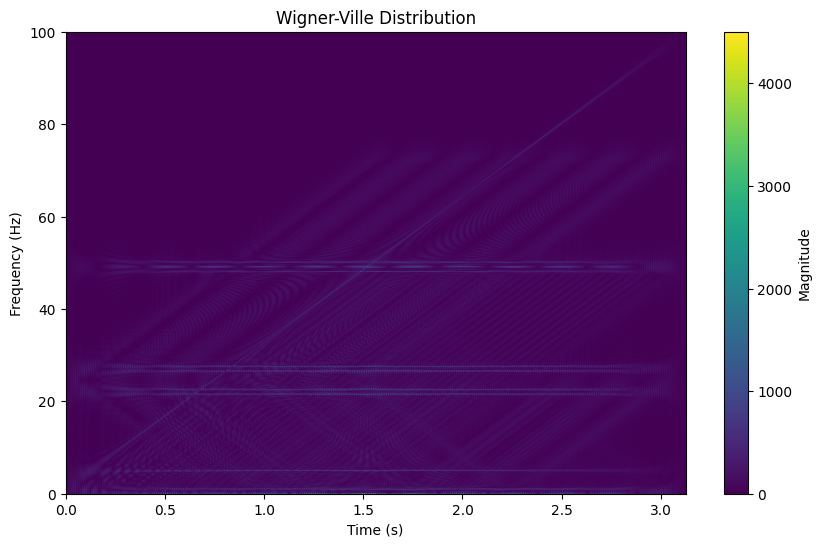

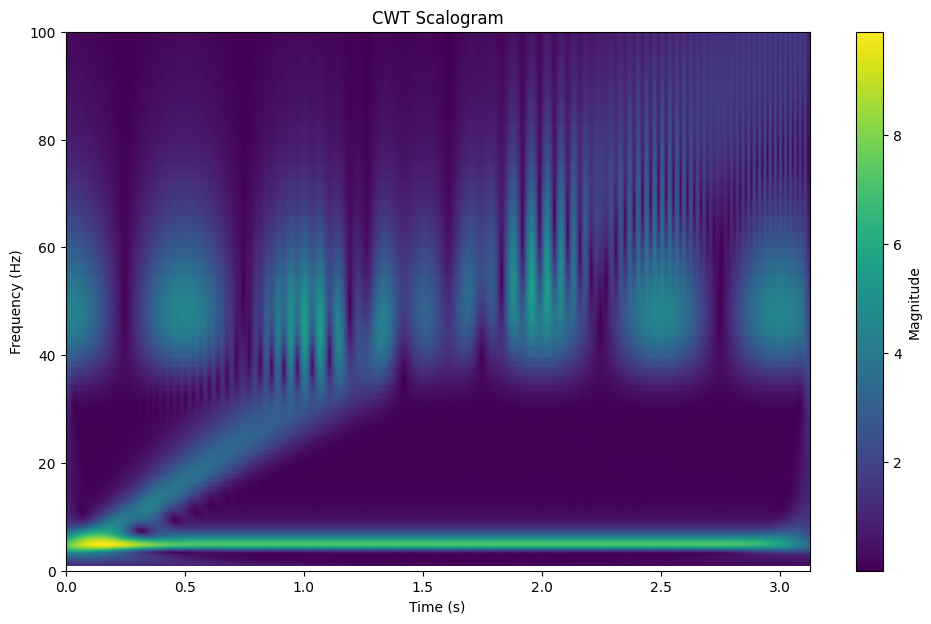

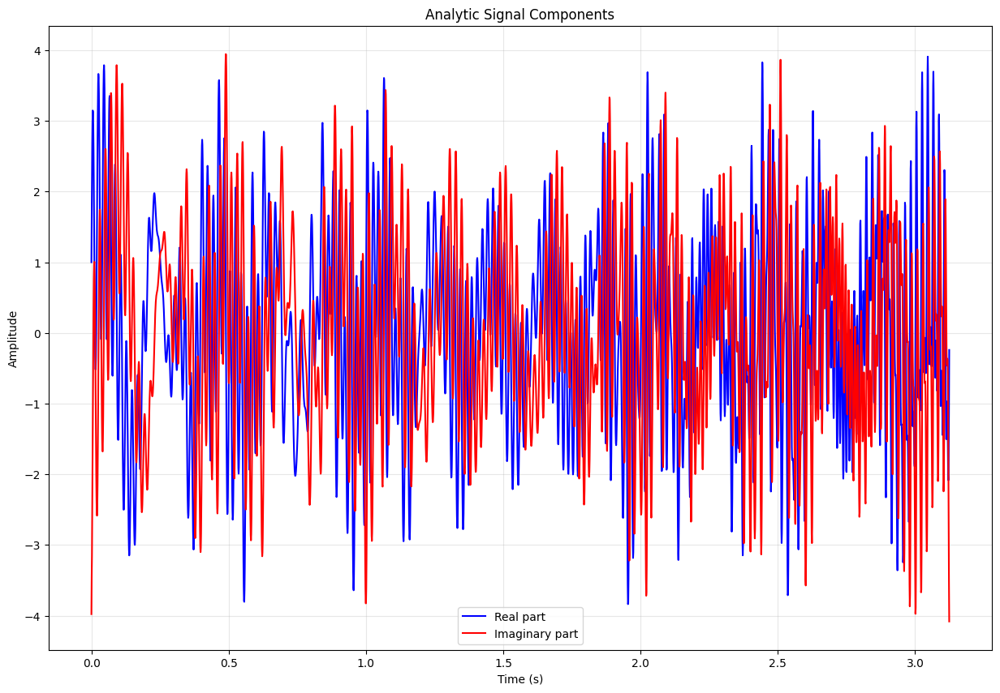

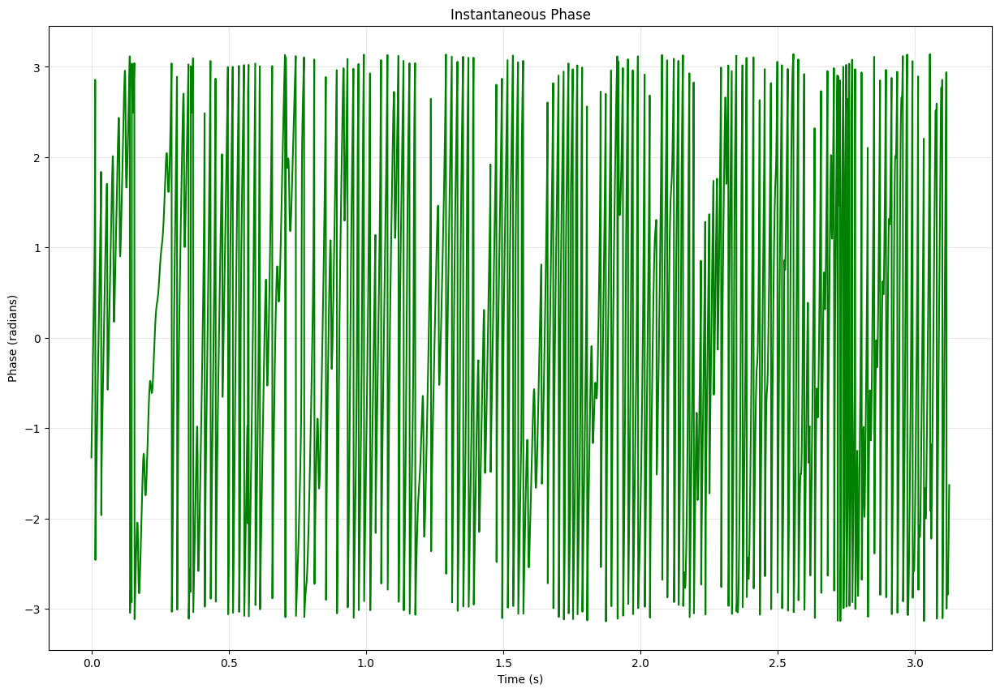

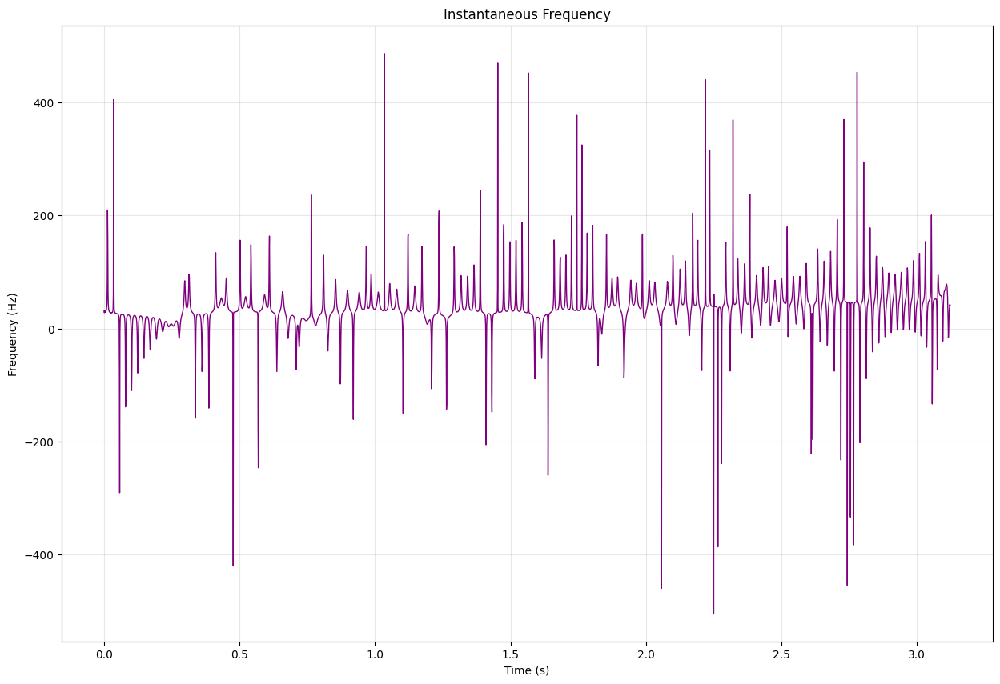

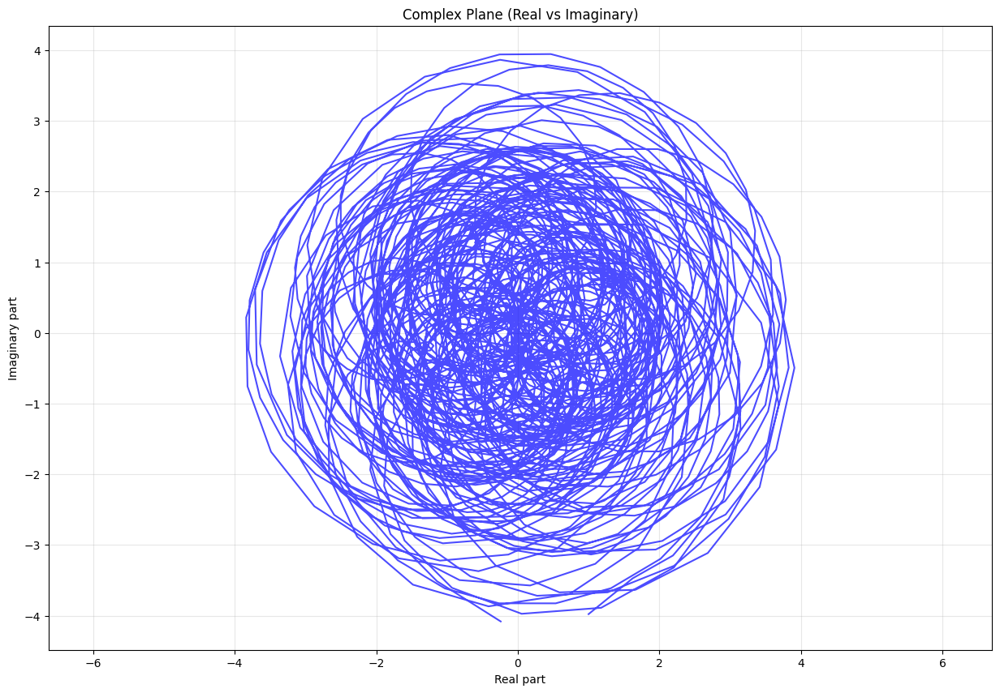

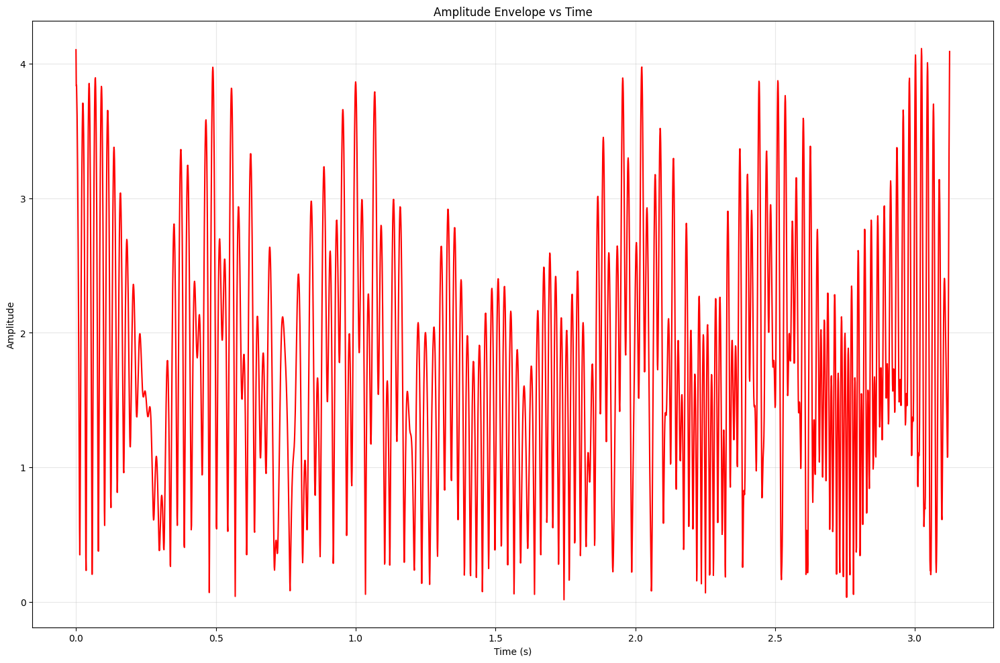

In [22]:
from scipy.signal import chirp

def add_chirp(signal, sr, f0=1, f1=100, t1=None, method='linear'):
    if t1 is None:
        t1 = len(signal) / sr
    
    time_axis = np.arange(len(signal)) / sr
    
    # Generate chirp
    chirp_signal = chirp(time_axis, f0, t1, f1, method=method)
    
    return signal + chirp_signal

freqs = [5, 48, 50]
sr = 1024
N = 3200

signal = generateMultiSinWave(freqs, N, sr)
signal_with_chirp = add_chirp(signal, sr)
plotSignal(signal_with_chirp)

xFFT, yFFT = FFT(signal_with_chirp, N, sr)
plotFFT(xFFT, yFFT)

xSTFT = STFT(signal_with_chirp, sr=sr, window_length=window_length, g_std=g_std, hop_length=hop_length)
plotSTFT(xSTFT, sr, max_freq=100, hop_length=hop_length)

wvd_matrix = WVT(signal_with_chirp)
plotWVD(wvd_matrix)

coefficients, frequencies = CWT(signal_with_chirp, sr=sr, min_freq=1, max_freq=100, num_scales=100, wavelet='cmor1.0-1.0')
plot_cwt(coefficients, frequencies, signal_with_chirp, sr)

analytic_signal, amplitude, phase, inst_freq = hilbert_analysis(signal_with_chirp, sr)
plot_hilbert_analysis(analytic_signal, amplitude, phase, inst_freq, sr)

## With Offset And White Noise

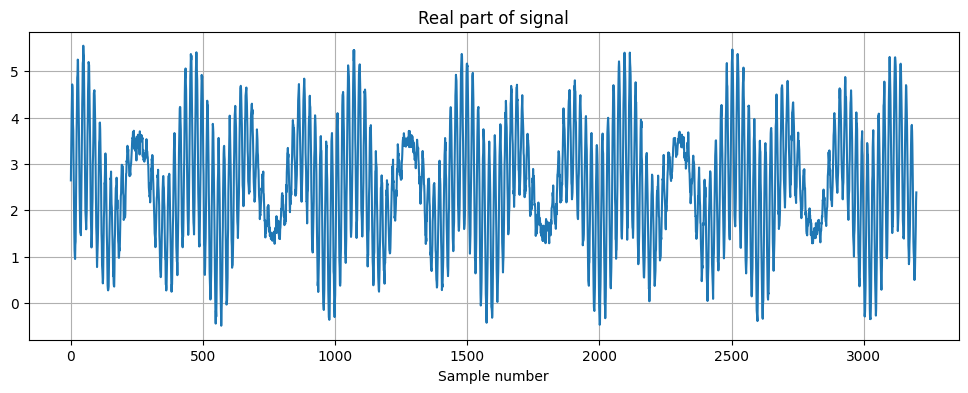

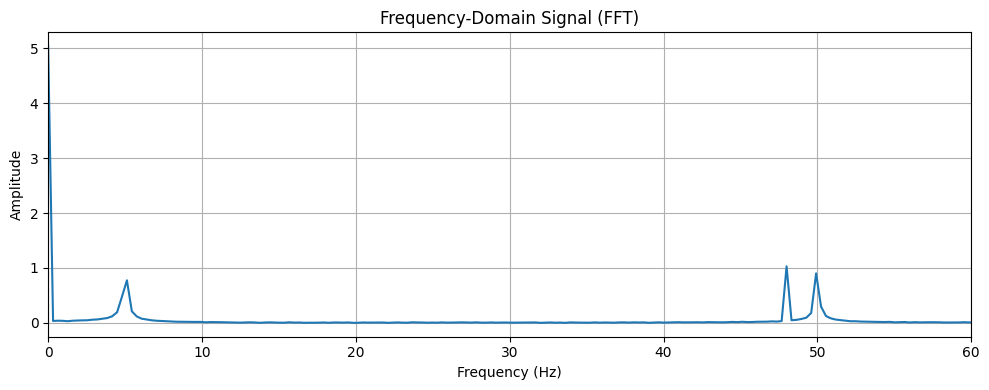

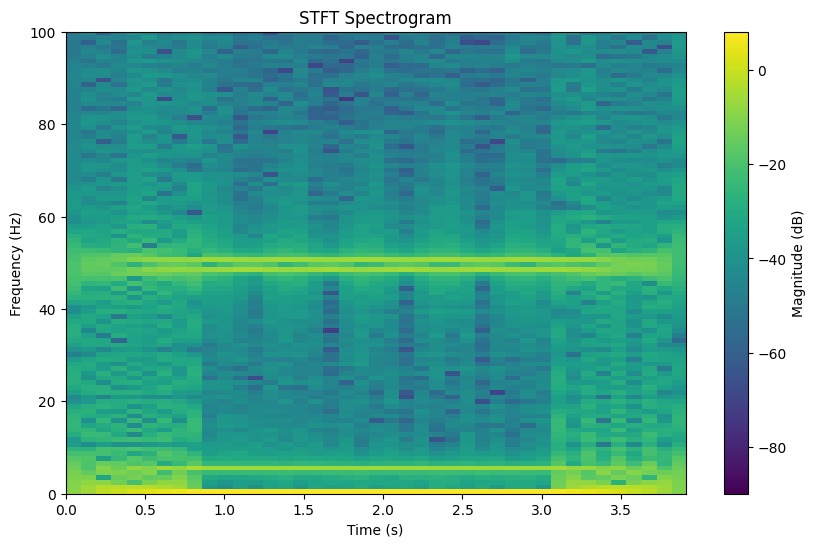

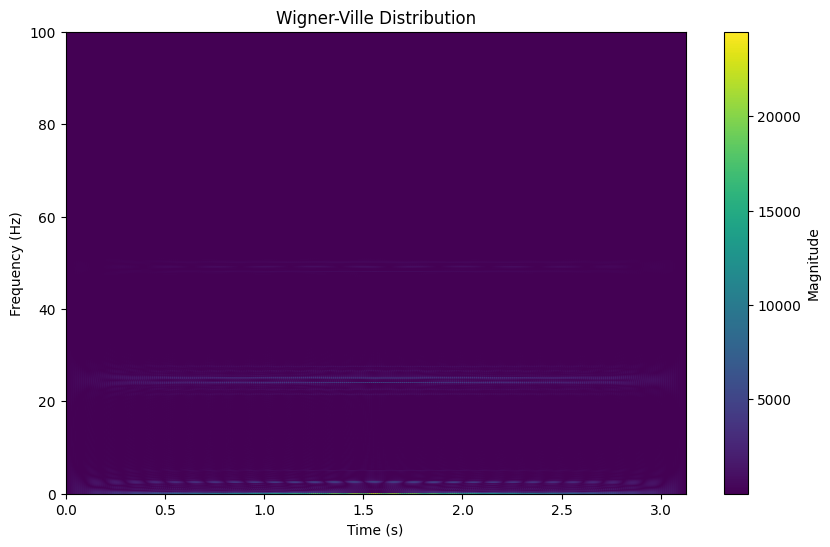

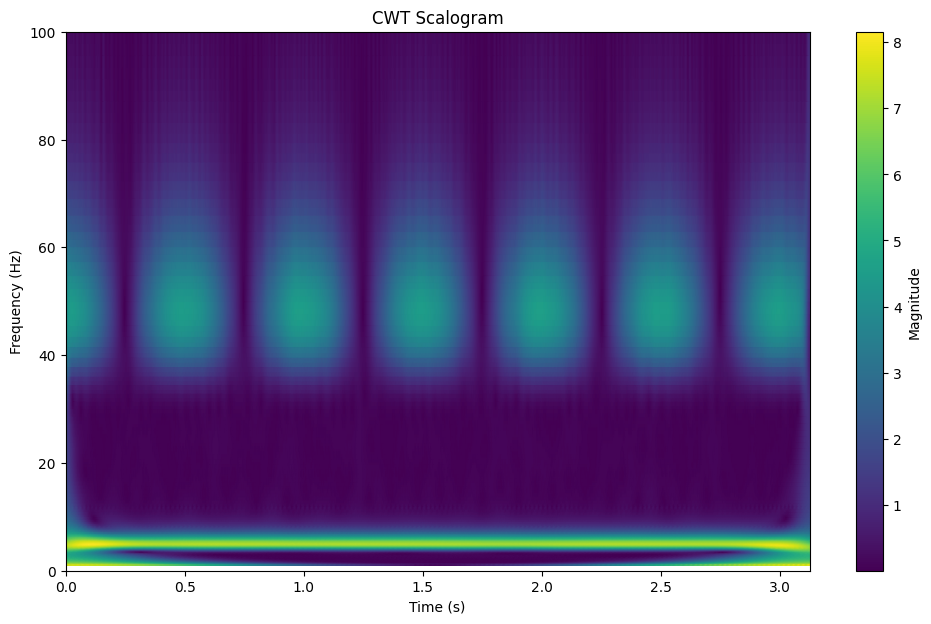

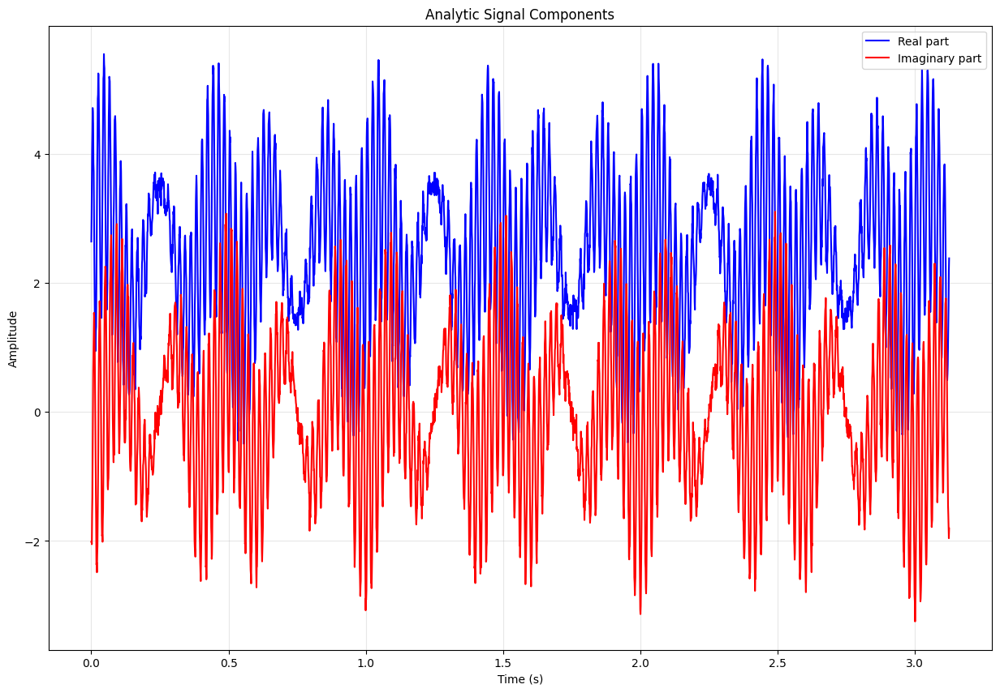

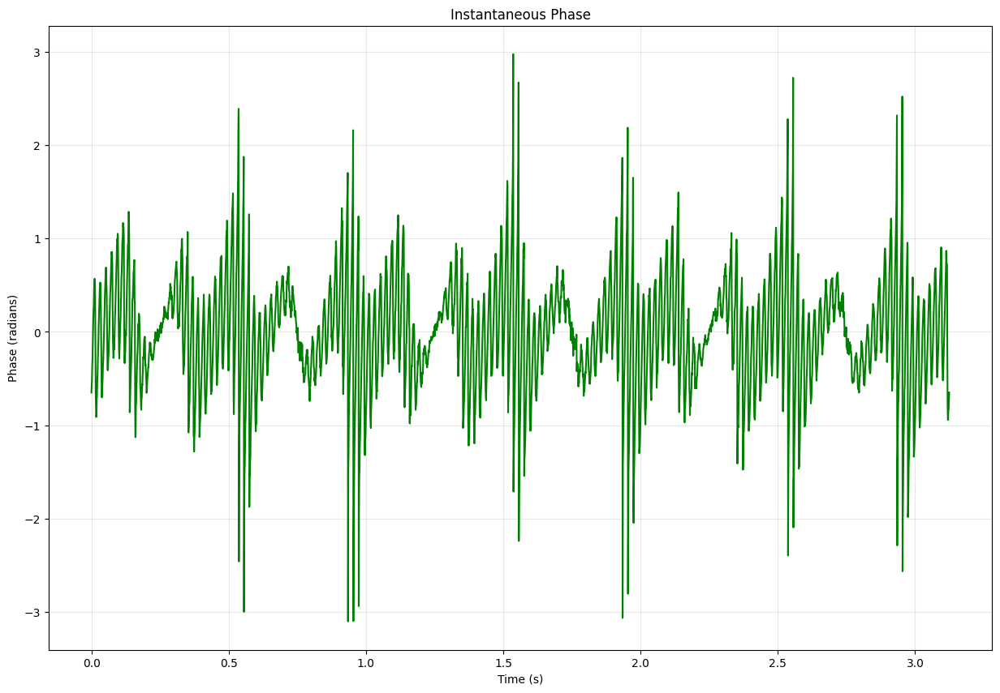

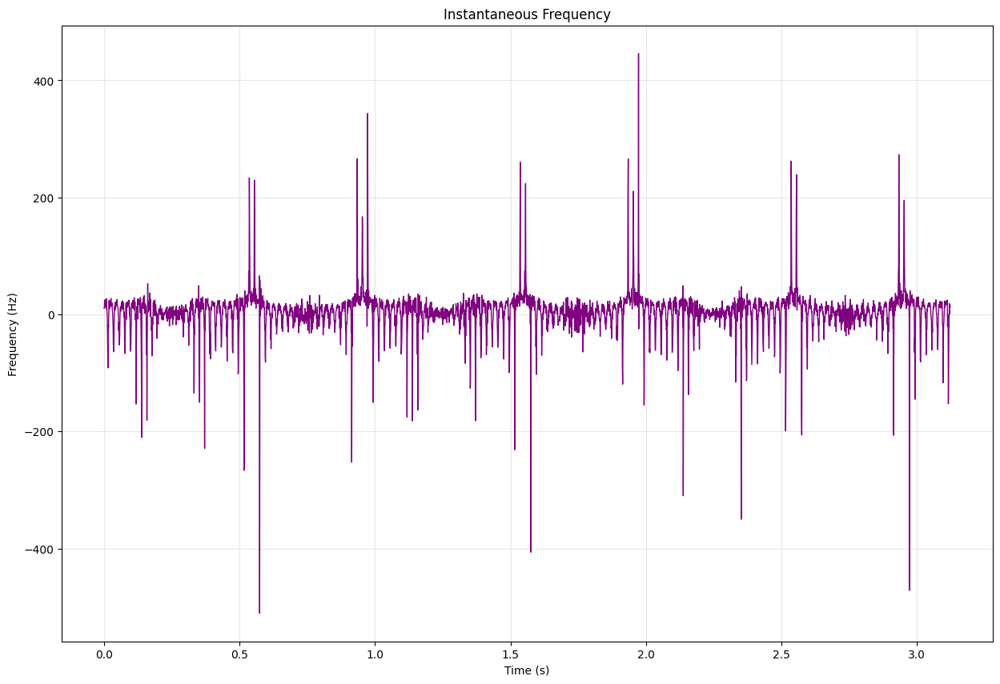

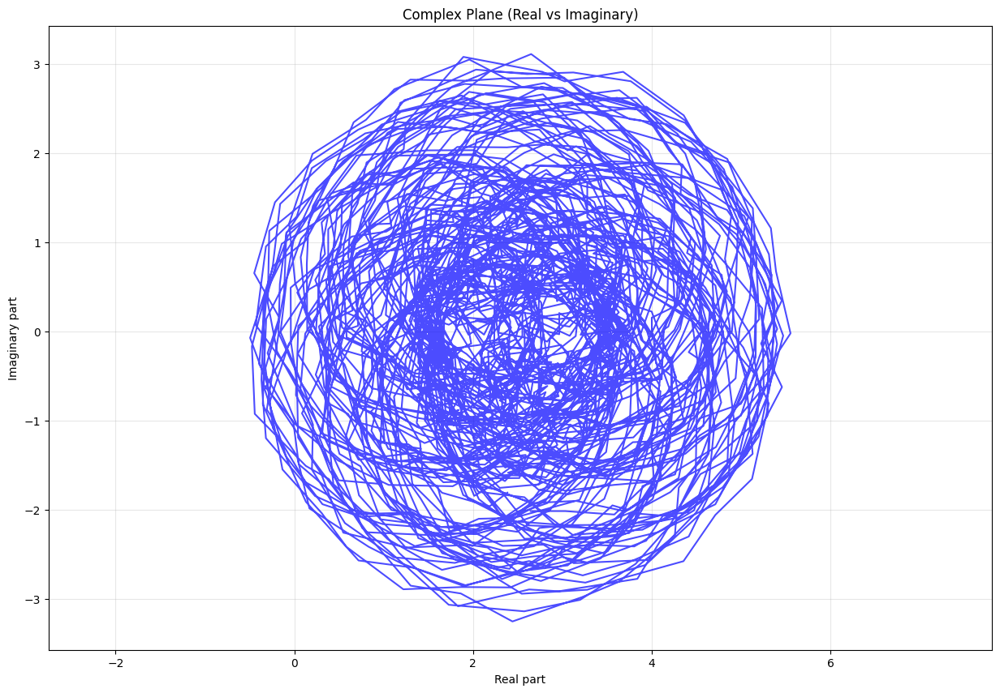

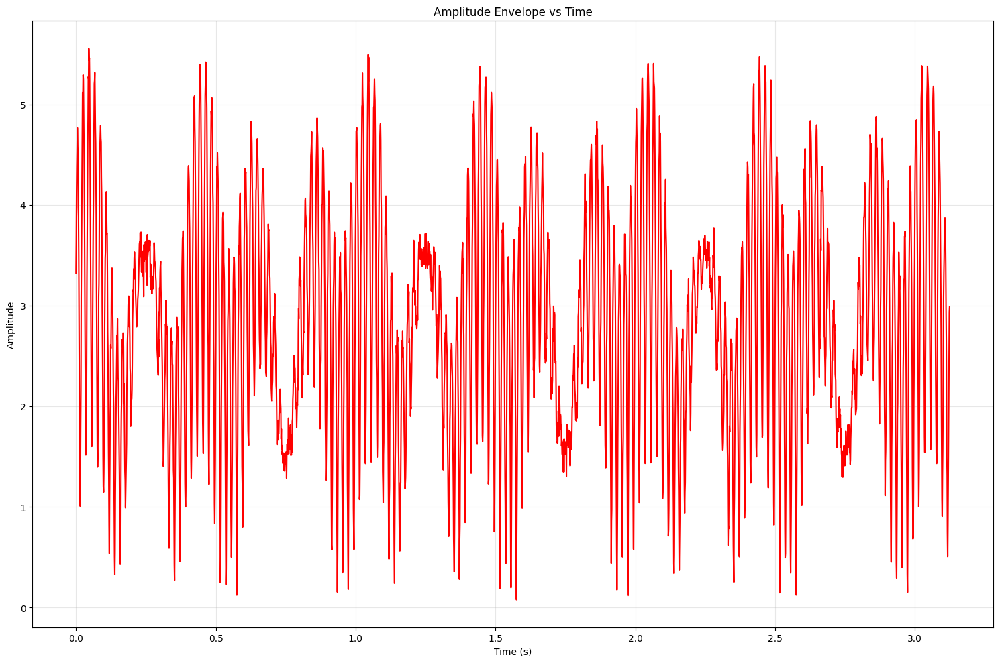

In [24]:
freqs = [5, 48, 50]
sr = 1024
N = 3200
offset = 2.5

signal = generateMultiSinWave(freqs, N, sr)
signal_with_noise = add_white_noise(signal)
signal_with_nois_and_offset = signal_with_noise + offset
plotSignal(signal_with_nois_and_offset)

xFFT, yFFT = FFT(signal_with_nois_and_offset, N, sr)
plotFFT(xFFT, yFFT)

xSTFT = STFT(signal_with_nois_and_offset, sr=sr, window_length=window_length, g_std=g_std, hop_length=hop_length)
plotSTFT(xSTFT, sr, max_freq=100, hop_length=hop_length)

wvd_matrix = WVT(signal_with_nois_and_offset)
plotWVD(wvd_matrix)

coefficients, frequencies = CWT(signal_with_nois_and_offset, sr=sr, min_freq=1, max_freq=100, num_scales=100, wavelet='cmor1.0-1.0')
plot_cwt(coefficients, frequencies, signal_with_nois_and_offset, sr)

analytic_signal, amplitude, phase, inst_freq = hilbert_analysis(signal_with_nois_and_offset, sr)
plot_hilbert_analysis(analytic_signal, amplitude, phase, inst_freq, sr)